find './reader_context_noising_with_scores (exp #5)' -name 'generation_info.json' -print0 | tar --null -cvf archive.tar --files-from=-

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from scipy.stats import pearsonr
import seaborn as sns
import math
import os
import json
import re

In [ ]:
!tar -xvf '/content/archive_20250508_v3.tar'

In [ ]:
def read_csv_2_dict(filename):
  with open(filename, 'r') as file:
      data = json.load(file)
  return data

def find_test_json_files(directory):
  test_json_files = []

  for root, dirs, files in os.walk(directory):
      if 'generation_info.json' in files:  #and 'mlqa' in root
          test_json_files.append(os.path.join(root, 'generation_info.json'))

  return test_json_files

In [ ]:
l = find_test_json_files('/content/reader_context_noising_with_scores (exp #5)')

In [ ]:
d = {}

for j in l:
    en = []
    len_ = []
    for i in read_csv_2_dict(j):
      if 'metainfo' in i.keys():
        if 'num_tokens' in i['metainfo'].keys():
          en.append(i['metainfo']['predictive_entropy'])
          len_.append(i['metainfo']['num_tokens'])

    fl = j.split('/')[4]+'/'+j.split('/')[5]
    sl = re.search(r'\d+\.\d+', j)
    tl = j.split('/')[-2]

    # if tl:
    if sl:
        key2 = sl.group(0) + tl

        if fl not in d:
            d[fl] = {}

        if key2 not in d[fl]:
            d[fl][key2] = {}

        if 'en' not in d[fl][key2]:
            d[fl][key2]['en'] = {}
            d[fl][key2]['len'] = {}

        d[fl][key2]['en'] = en
        d[fl][key2]['len'] = len_

In [ ]:
def prepare_olap(d, level1):
  data = []
  for fl, level2 in d[level1].items():
    en_list = level2.get('en', [])
    len_list = level2.get('len', [])
    if len(en_list) != len(len_list):
        raise ValueError(f"Разная длина")
    for en, length in zip(en_list, len_list):
        data.append({
            'exp': fl,
            'en': en,
            'len': length
        })
  return data

In [ ]:
hi = pd.DataFrame(prepare_olap(d, 'mlqa/hi'))
vi = pd.DataFrame(prepare_olap(d, 'mlqa/vi'))
de = pd.DataFrame(prepare_olap(d, 'mlqa/de'))
ru = pd.DataFrame(prepare_olap(d, 'mtssquad/logs_v2'))
en = pd.DataFrame(prepare_olap(d, 'squadv2/logs_v2'))

In [ ]:
vi['model'] = vi['exp'].apply(lambda x: int(x.replace('_with_error', '').split('.')[-1]))
hi['model'] = hi['exp'].apply(lambda x: int(x.replace('_with_error', '').split('.')[-1]))
de['model'] = de['exp'].apply(lambda x: int(x.replace('_with_error', '').split('.')[-1]))
ru['model'] = ru['exp'].apply(lambda x: 1 if len (x.replace('_with_error', '').split('v')[-1]) == 1 else int(x.replace('_with_error', '').split('v')[-1].split('.')[-1]))
en['model'] = en['exp'].apply(lambda x: 1 if len (x.replace('_with_error', '').split('v')[-1]) == 1 else int(x.replace('_with_error', '').split('v')[-1].split('.')[-1]))

In [ ]:
vi['lang'] = 'vi'
hi['lang'] = 'hi'
de['lang'] = 'de'
ru['lang'] = 'ru'
en['lang'] = 'en'

In [ ]:
vi['en_len_ratio'] = vi['en'] / vi['len']
hi['en_len_ratio'] = hi['en'] / hi['len']
de['en_len_ratio'] = de['en'] / de['len']
ru['en_len_ratio'] = ru['en'] / ru['len']
en['en_len_ratio'] = en['en'] / en['len']

In [ ]:
ru = ru[ru['exp'].str.len() == 9].reset_index(drop=True)

In [ ]:
def point_plot(d, type_model):

  df = d.copy()
  if type_model is not None:
      df = df[df['model']==type_model]

  exp_types = df['exp'].unique()
  num_exps = len(exp_types)

  rows, cols = 4, 5
  total_plots = rows * cols

  fig, axes = plt.subplots(rows, cols, figsize=(20, 16), sharex=False, sharey=False)
  axes = axes.flatten()

  for idx, exp in enumerate(exp_types):
      ax = axes[idx]
      subset = df[df['exp'] == exp]

      sns.regplot(
          data=subset,
          x='len',
          y='en',
          ax=ax,
          scatter=True,
          fit_reg=True,
          scatter_kws={'s': 50, 'alpha': 0.7},
          line_kws={'color': 'red'}
      )

      ax.set_title(f"exp: {exp}", fontsize=12)
      ax.set_xlabel('len', fontsize=10)
      ax.set_ylabel('en', fontsize=10)

  for idx in range(len(exp_types), total_plots):
      fig.delaxes(axes[idx])

  plt.tight_layout()

  plt.suptitle('Зависимость en от len для различных типов exp', fontsize=16, y=1.02)

  plt.show()

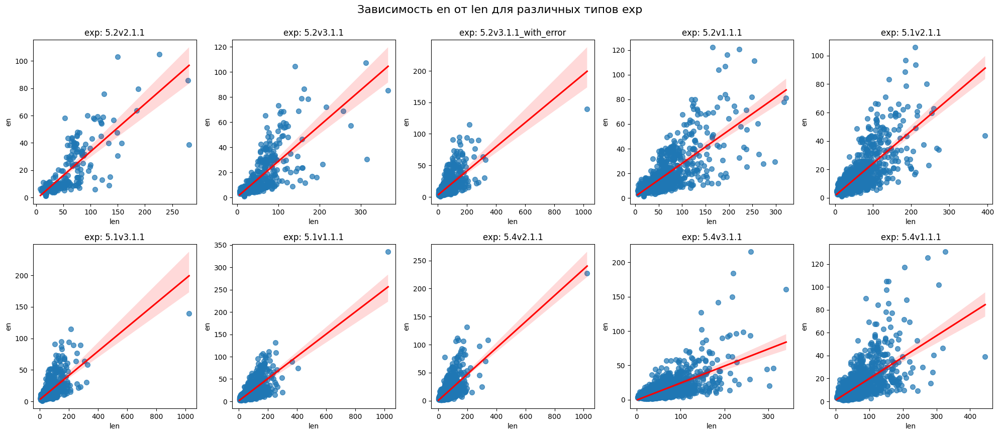

In [ ]:
point_plot(hi, 1)

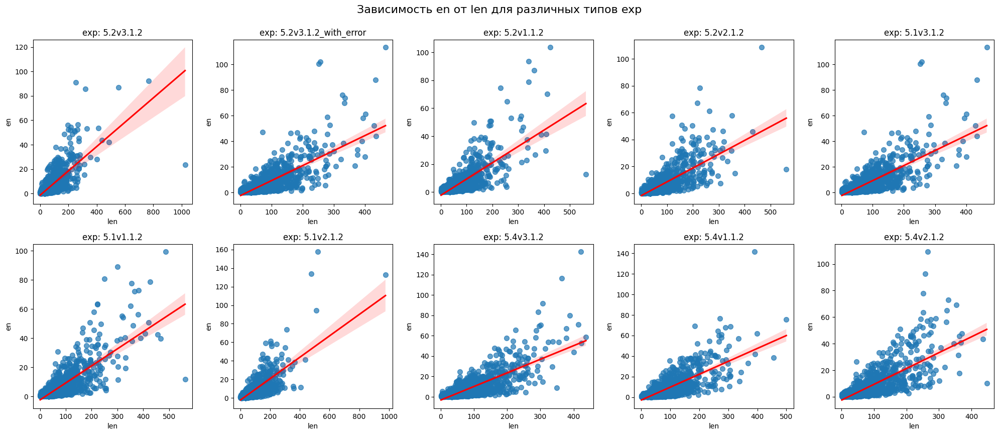

In [ ]:
point_plot(hi, 2)

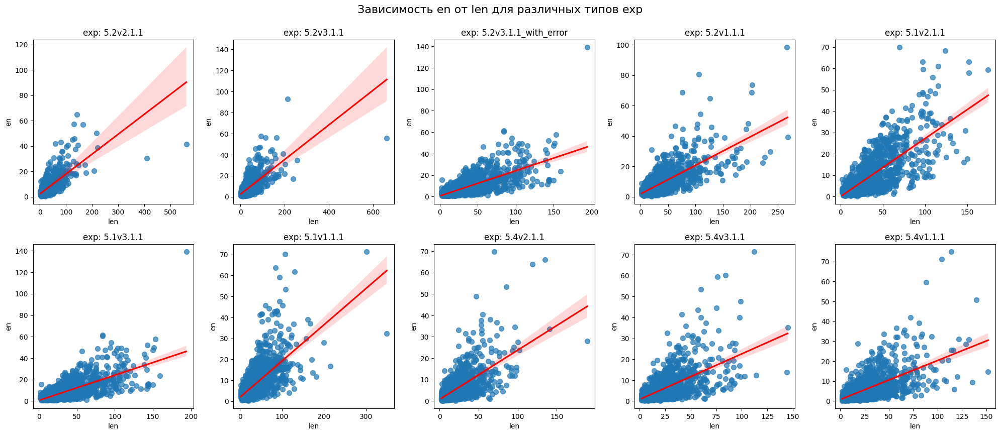

In [ ]:
point_plot(vi, 1)

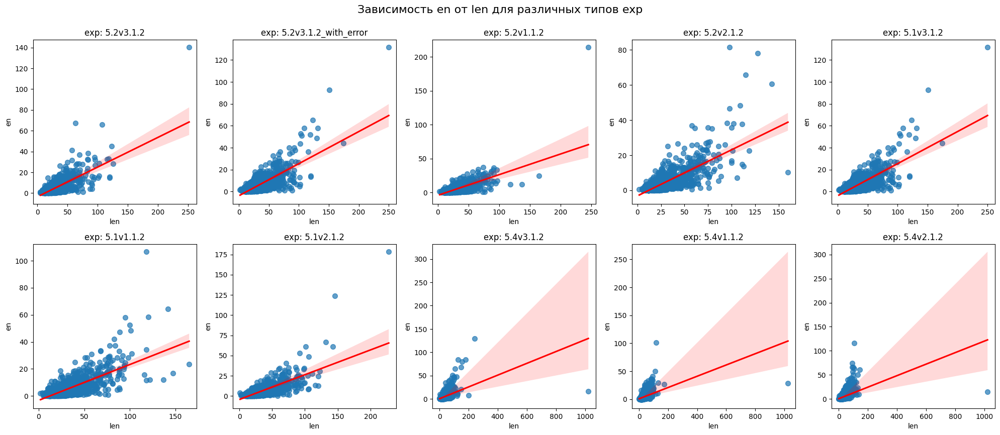

In [ ]:
point_plot(vi, 2)

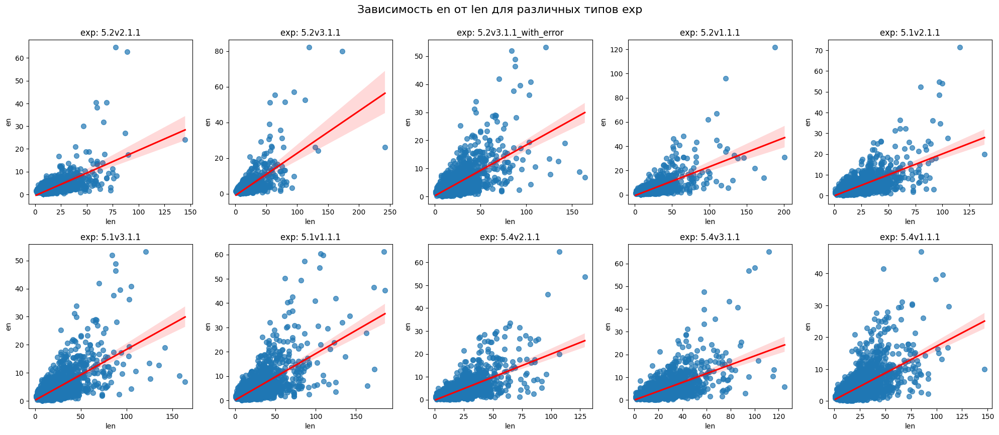

In [ ]:
point_plot(de, 1)

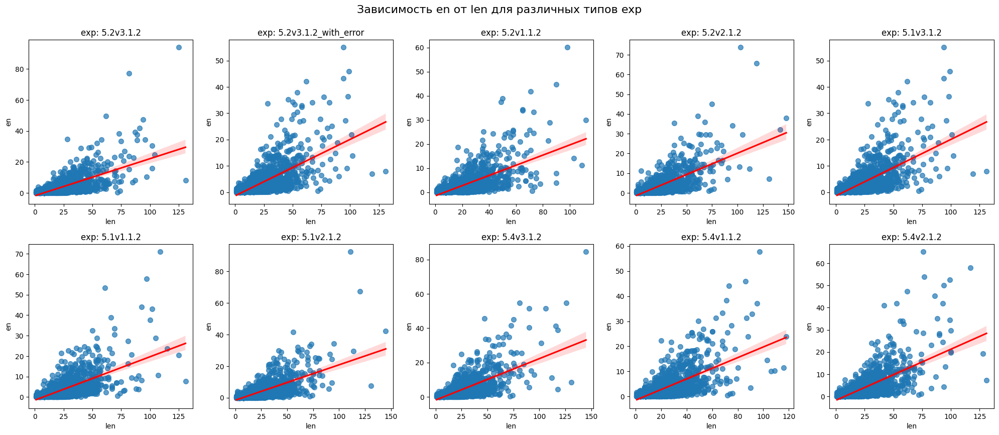

In [ ]:
point_plot(de, 2)

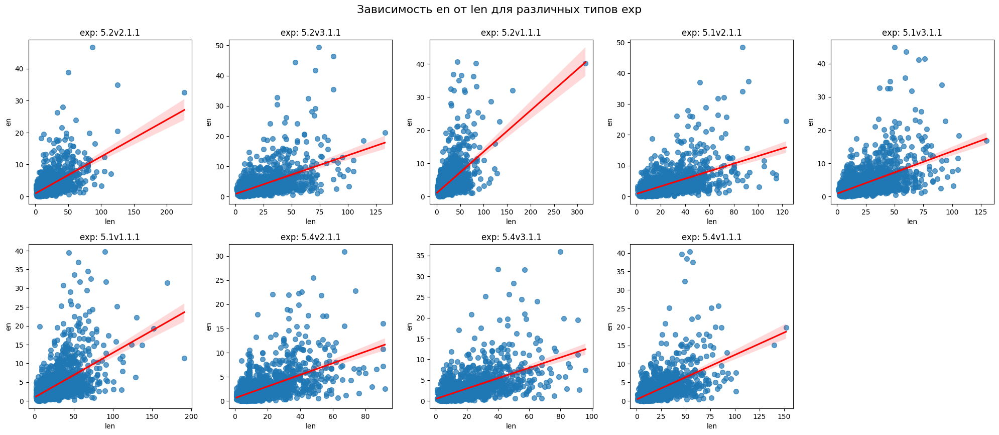

In [ ]:
point_plot(ru, 1)

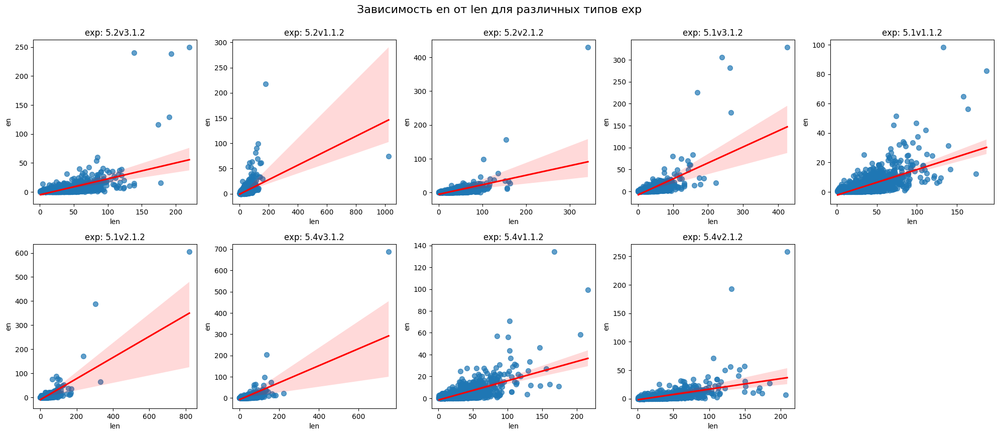

In [ ]:
point_plot(ru, 2)

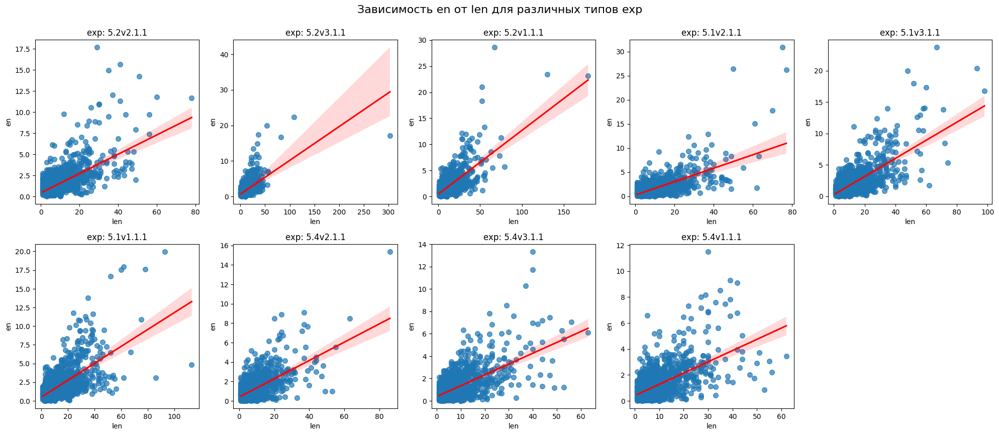

In [ ]:
point_plot(en, 1)

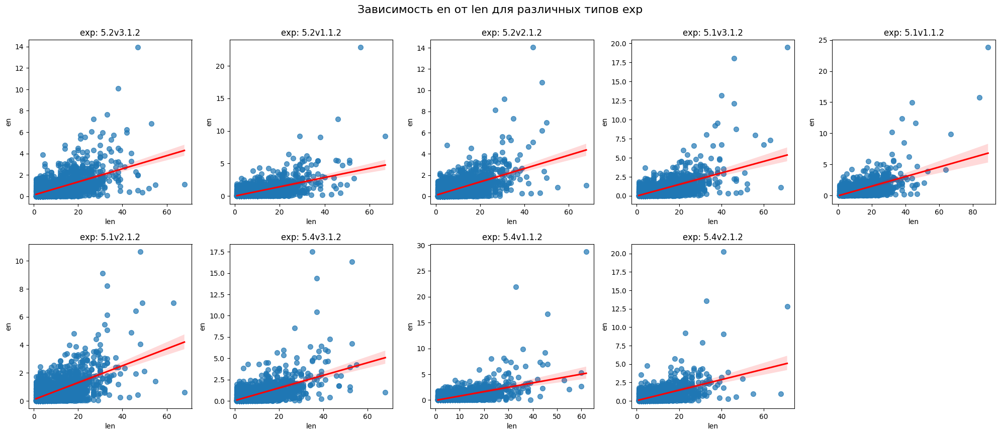

In [ ]:
point_plot(en, 2)

In [ ]:
def plot_hist(d, type_model=None):
  df = d.copy()

  if type_model is not None:
      df = df[df['model']==type_model]

  exp_types = df['exp'].unique()

  fig = go.Figure()

  for exp in exp_types:
      subset = df[df['exp'] == exp]
      fig.add_trace(
          go.Histogram(
              x=subset['en_len_ratio'],
              name=exp,
              opacity=0.6,
              autobinx=False,
              xbins=dict(
                  start=df['en_len_ratio'].min() - 0.005,
                  end=df['en_len_ratio'].max() + 0.005,
                  size=0.01
              )
          )
      )

  fig.update_layout(
      barmode='overlay',
      title='Гистограммы отношения en/len по типам exp',
      xaxis_title='en/len',
      yaxis_title='Количество',
      legend_title='Тип exp',
      template='plotly_white',
      bargap=0.1
  )

  fig.show()


In [ ]:
plot_hist(vi, 1)

In [ ]:

plot_hist(vi, 2)

In [ ]:
plot_hist(hi, 1)

In [ ]:
plot_hist(hi, 2)

In [ ]:
plot_hist(de, 1)

In [ ]:
plot_hist(de, 2)

In [ ]:
plot_hist(ru, 1)

In [ ]:
plot_hist(ru, 2)

In [ ]:
plot_hist(en, 1)

In [ ]:
plot_hist(en, 2)

In [ ]:
fig = px.histogram(hi[hi['model'] == 1].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(hi[hi['model'] == 2].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(vi[vi['model'] == 1].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(vi[vi['model'] == 2].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(de[de['model'] == 1].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(de[de['model'] == 2].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(ru[ru['model'] == 1].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(ru[ru['model'] == 2].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(en[en['model'] == 1].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
fig = px.histogram(en[en['model'] == 2].groupby('exp')['en'].median().reset_index(),
                   x='exp',
                   y='en',
                  #  histfunc='avg',
                   color='exp')
fig

In [ ]:
top_correct = pd.concat([vi[vi['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         hi[hi['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         de[de['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         en[en['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         ru[ru['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])]]).reset_index(drop=True)

middle_correct = pd.concat([vi[vi['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         hi[hi['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         de[de['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         en[en['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         ru[ru['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])]]).reset_index(drop=True)

bottom_correct = pd.concat([vi[vi['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         hi[hi['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         de[de['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         en[en['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         ru[ru['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])]]).reset_index(drop=True)
# ----------------
top_wrong = pd.concat([vi[vi['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         hi[hi['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         de[de['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         en[en['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         ru[ru['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])]]).reset_index(drop=True)

middle_wrong = pd.concat([vi[vi['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         hi[hi['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         de[de['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         en[en['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         ru[ru['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])]]).reset_index(drop=True)

bottom_wrong = pd.concat([vi[vi['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         hi[hi['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         de[de['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         en[en['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         ru[ru['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])]]).reset_index(drop=True)
# ----------------
top_nope = pd.concat([vi[vi['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         hi[hi['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         de[de['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         en[en['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         ru[ru['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])]]).reset_index(drop=True)

middle_nope = pd.concat([vi[vi['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         hi[hi['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         de[de['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         en[en['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         ru[ru['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])]]).reset_index(drop=True)

bottom_nope = pd.concat([vi[vi['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         hi[hi['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         de[de['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         en[en['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         ru[ru['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])]]).reset_index(drop=True)

In [ ]:
def plot_exp_by_lang(df, type_model=None):

  if type_model is not None:
      df = df[df['model']==type_model]

  exp_types = df['lang'].unique()

  fig = go.Figure()

  for exp in exp_types:
      subset = df[df['lang'] == exp]
      fig.add_trace(
          go.Histogram(
              x=subset['en_len_ratio'],
              name=exp,
              opacity=0.6,
              autobinx=False,
              xbins=dict(
                  start=df['en_len_ratio'].min() - 0.005,
                  end=df['en_len_ratio'].max() + 0.005,
                  size=0.01
              )
          )
      )

  fig.update_layout(
      barmode='overlay',
      title='Гистограммы отношения en/len по языкам',
      xaxis_title='en/len',
      yaxis_title='Количество',
      legend_title='Язык',
      template='plotly_white',
      bargap=0.1
  )

  fig.show()


In [ ]:
plot_exp_by_lang(top_correct, 1)

In [ ]:
plot_exp_by_lang(top_correct, 2)

In [ ]:
plot_exp_by_lang(middle_correct, 1)

In [ ]:
plot_exp_by_lang(middle_correct, 2)

In [ ]:
plot_exp_by_lang(bottom_correct, 1)

In [ ]:
plot_exp_by_lang(bottom_correct, 2)

In [ ]:
plot_exp_by_lang(top_wrong, 1)

In [ ]:
plot_exp_by_lang(top_wrong, 2)

In [ ]:
plot_exp_by_lang(middle_wrong, 1)

In [ ]:
plot_exp_by_lang(middle_wrong, 2)

In [ ]:
plot_exp_by_lang(bottom_wrong, 1)

In [ ]:
plot_exp_by_lang(bottom_wrong, 2)

In [ ]:
plot_exp_by_lang(top_nope, 1)

In [ ]:
plot_exp_by_lang(top_nope, 2)

In [ ]:
plot_exp_by_lang(middle_nope, 1)

In [ ]:
plot_exp_by_lang(middle_nope, 2)

In [ ]:
plot_exp_by_lang(bottom_nope, 1)

In [ ]:
plot_exp_by_lang(bottom_nope, 2)

In [ ]:
threshold = 300

In [ ]:
def highlight_pval(val):
    color = 'background-color: lightgreen' if val < 0.05 else ''
    return color

In [ ]:
def p_corr(df):
  corr_results = []
  pval_results = []

  for exp_val in df['exp'].unique():
      subset = df[df['exp'] == exp_val]
      if len(subset) > 1:
          corr, pval = pearsonr(subset['en_len_ratio'], subset['len'])
          corr_results.append({'exp': exp_val, 'Correlation': corr})
          pval_results.append({'exp': exp_val, 'P-value': pval})

  corr_df = pd.DataFrame(corr_results).set_index('exp')
  pval_df = pd.DataFrame(pval_results).set_index('exp')
  styled_corr_df = corr_df.style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1).format("{:.3f}")
  styled_pval_df = pval_df.style.map(highlight_pval) #.format("{:.4f}")

  return pd.concat([corr_df, pval_df], axis=1)

In [ ]:
p_corr(ru[ru['len']<=threshold])

,Correlation,P-value
exp,,
5.2v3.1.2,0.029975,1.802428e-01
5.2v2.1.1,-0.246504,4.554445e-29
5.2v3.1.1,-0.268783,1.930443e-34
5.2v1.1.1,-0.293206,6.328110e-41
5.2v1.1.2,0.045960,3.991192e-02
5.2v2.1.2,-0.069058,2.005931e-03
5.1v3.1.2,0.105020,2.531804e-06
5.1v2.1.1,-0.262281,8.090386e-33
5.1v3.1.1,-0.282761,4.399821e-38


In [ ]:
p_corr(en[en['len']<=threshold])

,Correlation,P-value
exp,,
5.2v3.1.2,-0.202832,5.160572e-20
5.2v2.1.1,-0.340334,2.034678e-55
5.2v3.1.1,-0.330013,5.355883e-52
5.2v1.1.1,-0.299198,1.215856e-42
5.2v1.1.2,-0.178079,1.030649e-15
5.2v2.1.2,-0.182820,1.716642e-16
5.1v3.1.2,-0.156132,2.199845e-12
5.1v2.1.1,-0.261920,9.923728e-33
5.1v3.1.1,-0.263444,4.178286e-33


In [ ]:
p_corr(vi[vi['len']<=threshold])

,Correlation,P-value
exp,,
5.2v3.1.2,0.436199,1.104441e-93
5.2v2.1.1,-0.210036,2.342623e-21
5.2v3.1.2_with_error,0.389993,1.197811e-73
5.2v3.1.1,-0.213703,4.436135e-22
5.2v3.1.1_with_error,-0.172464,8.084243e-15
5.2v1.1.1,-0.235596,1.259335e-26
5.2v1.1.2,0.426267,4.155081e-89
5.2v2.1.2,0.454467,1.654945e-102
5.1v3.1.2,0.389993,1.197811e-73


In [ ]:
p_corr(hi[hi['len']<=threshold])

,Correlation,P-value
exp,,
5.2v3.1.2,-0.022322,3.198399e-01
5.2v2.1.1,0.161001,4.388973e-13
5.2v3.1.2_with_error,-0.053257,1.770348e-02
5.2v3.1.1,0.040480,7.052083e-02
5.2v3.1.1_with_error,-0.238014,4.171801e-27
5.2v1.1.1,-0.152275,7.797198e-12
5.2v1.1.2,-0.051488,2.188791e-02
5.2v2.1.2,-0.081073,2.973763e-04
5.1v3.1.2,-0.053257,1.770348e-02


In [ ]:
p_corr(de[de['len']<=threshold])

,Correlation,P-value
exp,,
5.2v3.1.2,0.230494,1.586324e-25
5.2v2.1.1,0.029749,1.835634e-01
5.2v3.1.2_with_error,0.189200,1.424015e-17
5.2v3.1.1,0.098568,1.004994e-05
5.2v3.1.1_with_error,-0.152526,7.030028e-12
5.2v1.1.1,-0.025263,2.587881e-01
5.2v1.1.2,0.238822,2.458567e-27
5.2v2.1.2,0.154319,3.958730e-12
5.1v3.1.2,0.189200,1.424015e-17


In [ ]:
top_correct = pd.concat([vi[vi['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         hi[hi['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         de[de['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         en[en['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])],
                         ru[ru['exp'].isin(['5.1v1.1.1', '5.1v1.1.2'])]]).reset_index(drop=True)

middle_correct = pd.concat([vi[vi['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         hi[hi['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         de[de['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         en[en['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])],
                         ru[ru['exp'].isin(['5.1v3.1.1', '5.1v3.1.2'])]]).reset_index(drop=True)

bottom_correct = pd.concat([vi[vi['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         hi[hi['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         de[de['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         en[en['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])],
                         ru[ru['exp'].isin(['5.1v2.1.1', '5.1v2.1.2'])]]).reset_index(drop=True)
# ----------------
top_wrong = pd.concat([vi[vi['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         hi[hi['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         de[de['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         en[en['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])],
                         ru[ru['exp'].isin(['5.2v1.1.1', '5.2v1.1.2'])]]).reset_index(drop=True)

middle_wrong = pd.concat([vi[vi['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         hi[hi['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         de[de['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         en[en['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])],
                         ru[ru['exp'].isin(['5.2v3.1.1', '5.2v3.1.2'])]]).reset_index(drop=True)

bottom_wrong = pd.concat([vi[vi['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         hi[hi['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         de[de['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         en[en['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])],
                         ru[ru['exp'].isin(['5.2v2.1.1', '5.2v2.1.2'])]]).reset_index(drop=True)
# ----------------
top_nope = pd.concat([vi[vi['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         hi[hi['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         de[de['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         en[en['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])],
                         ru[ru['exp'].isin(['5.4v1.1.1', '5.4v1.1.2'])]]).reset_index(drop=True)

middle_nope = pd.concat([vi[vi['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         hi[hi['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         de[de['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         en[en['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])],
                         ru[ru['exp'].isin(['5.4v3.1.1', '5.4v3.1.2'])]]).reset_index(drop=True)

bottom_nope = pd.concat([vi[vi['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         hi[hi['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         de[de['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         en[en['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])],
                         ru[ru['exp'].isin(['5.4v2.1.1', '5.4v2.1.2'])]]).reset_index(drop=True)

In [ ]:
abs_top = pd.concat([top_correct, top_wrong, top_nope])
abs_middle = pd.concat([middle_correct, middle_wrong, middle_nope])
abs_bottom = pd.concat([bottom_correct, bottom_wrong, bottom_nope])

In [ ]:
abs_correct = pd.concat([top_correct, middle_correct, bottom_correct ])
abs_wrong = pd.concat([top_wrong, middle_wrong, bottom_wrong])
abs_nope = pd.concat([top_nope, middle_nope, bottom_nope])

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests

def t_group(l, m, group1_, group2_, group3_, s1, s2, s3, bonferroni = True):
  group1 = group1_[(group1_['lang'] == l) & (group1_['model'] == m)]['en_len_ratio']
  group2 = group2_[(group2_['lang'] == l) & (group2_['model'] == m)]['en_len_ratio']
  group3 = group3_[(group3_['lang'] == l) & (group3_['model'] == m)]['en_len_ratio']

  t1, p1 = stats.ttest_ind(group1, group2)
  t2, p2 = stats.ttest_ind(group1, group3)
  t3, p3 = stats.ttest_ind(group2, group3)

  p_values = [p1, p2, p3]

  if bonferroni:
    corrected = multipletests(p_values, alpha=0.05, method='holm')
    p_values = corrected[1]

  pairs = [(f"{s1} / {s2}", p_values[0]),
          (f"{s1} / {s3}", p_values[1]),
          (f"{s2} / {s3}", p_values[2])]

  for pair, p_corr in pairs:
      if p_corr < 0.05:
          print(f"{pair}: p-val = {p_corr:.4f} (+)")
      else:
          print(f"{pair}: p-val = {p_corr:.4f} (-)")

In [ ]:
t_group('ru', 1, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0901 (-)
top / bottom: p-val = 0.0137 (+)
middle / bottom: p-val = 0.3769 (-)


In [ ]:
t_group('en', 1, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.9633 (-)
top / bottom: p-val = 0.8996 (-)
middle / bottom: p-val = 0.9633 (-)


In [ ]:
t_group('vi', 1, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0002 (+)
top / bottom: p-val = 0.0000 (+)
middle / bottom: p-val = 0.0208 (+)


In [ ]:
t_group('hi', 1, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0779 (-)
top / bottom: p-val = 0.0779 (-)
middle / bottom: p-val = 0.9399 (-)


In [ ]:
t_group('de', 1, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0000 (+)
top / bottom: p-val = 0.0000 (+)
middle / bottom: p-val = 0.5855 (-)


In [ ]:
t_group('ru', 2, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.3737 (-)
top / bottom: p-val = 0.6830 (-)
middle / bottom: p-val = 0.5331 (-)


In [ ]:
t_group('en', 2, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.6242 (-)
top / bottom: p-val = 0.7881 (-)
middle / bottom: p-val = 0.7881 (-)


In [ ]:
t_group('vi', 2, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0154 (+)
top / bottom: p-val = 0.9977 (-)
middle / bottom: p-val = 0.0156 (+)


In [ ]:
t_group('hi', 2, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0690 (-)
top / bottom: p-val = 0.0254 (+)
middle / bottom: p-val = 0.5164 (-)


In [ ]:
t_group('de', 2, abs_top, abs_middle, abs_bottom,'top', 'middle', 'bottom')

top / middle: p-val = 0.0000 (+)
top / bottom: p-val = 0.0001 (+)
middle / bottom: p-val = 0.7375 (-)


In [ ]:
t_group('ru', 1, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.0071 (+)
correct / nope: p-val = 0.0000 (+)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('en', 1, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.2436 (-)
correct / nope: p-val = 0.0000 (+)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('vi', 1, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.0075 (+)
correct / nope: p-val = 0.2198 (-)
wrong / nope: p-val = 0.2198 (-)


In [ ]:
t_group('hi', 1, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.7473 (-)
correct / nope: p-val = 0.0000 (+)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('de', 1, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.0000 (+)
correct / nope: p-val = 0.2619 (-)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('ru', 2, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.2421 (-)
correct / nope: p-val = 0.0000 (+)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('en', 2, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.1668 (-)
correct / nope: p-val = 0.1070 (-)
wrong / nope: p-val = 0.6608 (-)


In [ ]:
t_group('vi', 2, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.0000 (+)
correct / nope: p-val = 0.6375 (-)
wrong / nope: p-val = 0.0000 (+)


In [ ]:
t_group('hi', 2, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.3635 (-)
correct / nope: p-val = 0.7341 (-)
wrong / nope: p-val = 0.7341 (-)


In [ ]:
t_group('de', 2, abs_correct, abs_wrong, abs_nope,'correct', 'wrong', 'nope')

correct / wrong: p-val = 0.0007 (+)
correct / nope: p-val = 0.7823 (-)
wrong / nope: p-val = 0.0014 (+)
